# End-to-end Test

In [1]:
%matplotlib inline
import matplotlib.pylab as plt
import numpy as np
import sys
import random
import time
import scipy  
# import nibabel as nib
from keras.optimizers import Adam
MY_UTILS_PATH = "../Modules/"
if not MY_UTILS_PATH in sys.path:
    sys.path.append(MY_UTILS_PATH)
import frequency_spatial_network as fsnet
sys.path.append('/home/sumeet_ranka47_gmail_com/git/fastMRI')
from data.mri_data import SliceData
from models.unet import train_unet as unet
import data.transforms as transforms
import common.subsample as subsample
import h5py
from skimage.measure import compare_ssim as ssim

Using TensorFlow backend.


### Testing model on FastMRI data

In [2]:
import cv2 as cv
def mse(imageA, imageB):
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return err

def compare_images(imageA, imageB, imageC):
    
    imageA = cv.normalize(imageA,  imageA, 0, 255, cv.NORM_MINMAX)
    imageB = cv.normalize(imageB,  imageB, 0, 255, cv.NORM_MINMAX)
    imageC = cv.normalize(imageC,  imageC, 0, 255, cv.NORM_MINMAX)
    
    mb = mse(imageA, imageB)
    sb = ssim(imageA, imageB)
    mc = mse(imageA, imageC)
    sc = ssim(imageA, imageC)

    fig = plt.figure(figsize=(10,10))
    plt.suptitle("Target vs network MSE: %.2f, SSIM: %.2f" % (mb, sb)+" Target vs Zeroimputed MSE: %.2f, SSIM: %.2f" % (mc, sc))
     
    ax = fig.add_subplot(2, 2, 1)
    plt.imshow(imageA)
    plt.axis("off")

    ax = fig.add_subplot(2, 2, 2)
    plt.imshow(imageB)
    plt.axis("off")
    
    ax = fig.add_subplot(2, 2, 3)
    plt.imshow(imageA)
    plt.axis("off")

    ax = fig.add_subplot(2, 2, 4)
    plt.imshow(imageC)
    plt.axis("off")  
    plt.show()

### Loading Testing Data

In [3]:
class Arguments:
    def __init__(self,batch_size,data_path,center_fractions,accelerations,challenge,sample_rate,resolution,resume,learning_rate,epoch,reluslope,exp_dir,checkpoint):
        self.batch_size = batch_size
        self.data_path = data_path
        self.center_fractions = center_fractions
        self.accelerations = accelerations
        self.challenge = challenge
        self.sample_rate = sample_rate
        self.resolution = resolution
        self.resume = resume
        self.learning_rate = learning_rate
        self.epoch = epoch
        self.reluslope = reluslope
        self.exp_dir = exp_dir
        self.checkpoint = checkpoint
        
#model hyperparameters
batch_size = 10
learning_rate = 0.001
epoch = 5
reluslope = 0.1

#other parameters
center_fractions = [0.08, 0.04]
accelerations = [4, 8]
challenge = 'singlecoil'
sample_rate = 1.
resolution = 320

data_path = '/home/sumeet_ranka47_gmail_com/data/singlecoil_val'
resume = False
checkpoint = 'DAEcheckpoint_v4/model.pt'
exp_dir = 'DAEcheckpoint_v4'
        
args=Arguments(batch_size,data_path,center_fractions,accelerations,challenge,sample_rate,resolution,resume,learning_rate,epoch,reluslope,exp_dir,checkpoint)

In [4]:
from torch.utils.data import DataLoader
dev_mask = subsample.MaskFunc(args.center_fractions, args.accelerations)
dev_data = SliceData(
        root=args.data_path,
        transform=unet.DataTransform(dev_mask, args.resolution, args.challenge, use_seed=True),
        sample_rate=args.sample_rate,
        challenge=args.challenge,
    )

dev_loader = DataLoader(
        dataset=dev_data,
        batch_size=args.batch_size,
        num_workers=8,
        pin_memory=True,
    )

for iter, data in enumerate(dev_loader):
    input, target, mean, std, norm = data
    break

temp2 = np.fft.fft2(target)
original_kspace = np.zeros((temp2.shape[0],temp2.shape[1],temp2.shape[2],2))
original_kspace[0:10,:,:,0] = temp2[0:10].real
original_kspace[0:10,:,:,1] = temp2[0:10].imag

temp = np.fft.fft2(input)
masked_kspace = np.zeros((temp.shape[0],temp.shape[1],temp.shape[2],2))
masked_kspace[0:10,:,:,0] = temp[0:10].real
masked_kspace[0:10,:,:,1] = temp[0:10].imag

In [5]:
import copy
def standardize(maskedkspace):
    output = copy.deepcopy(maskedkspace)
    temp = np.array(maskedkspace[:,:,:,0]) +1j*np.array(maskedkspace[:,:,:,1])
    mean = temp.mean()
    std = temp.std()
    temp = (temp-mean)/std
    output[:,:,:,0] = temp.real
    output[:,:,:,1] = temp.imag
    return output
smasked_kspace = standardize(masked_kspace[0:10,:,:,:])

Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Colocations handled automatically by placer.
/usr/local/lib/python3.6/site-packages/skimage/measure/_structural_similarity.py:149: UserWarning: Inputs have mismatched dtype.  Setting data_range based on X.dtype.
  warn("Inputs have mismatched dtype.  Setting data_range based on "
/usr/local/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]


<Figure size 432x288 with 0 Axes>

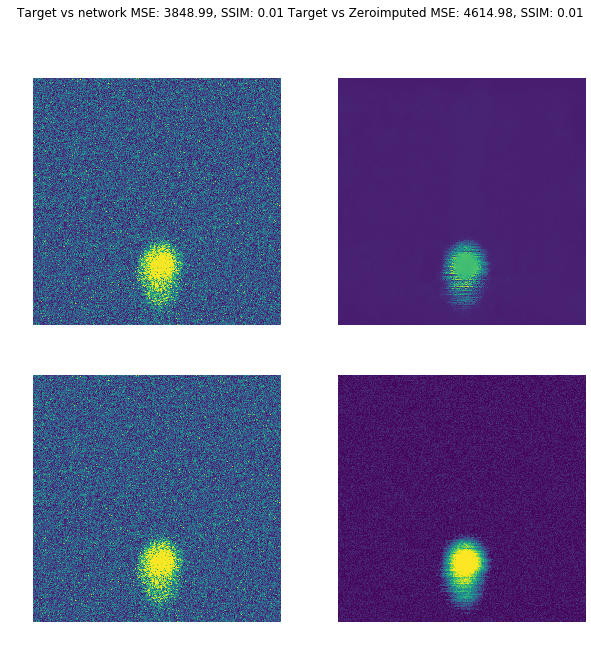

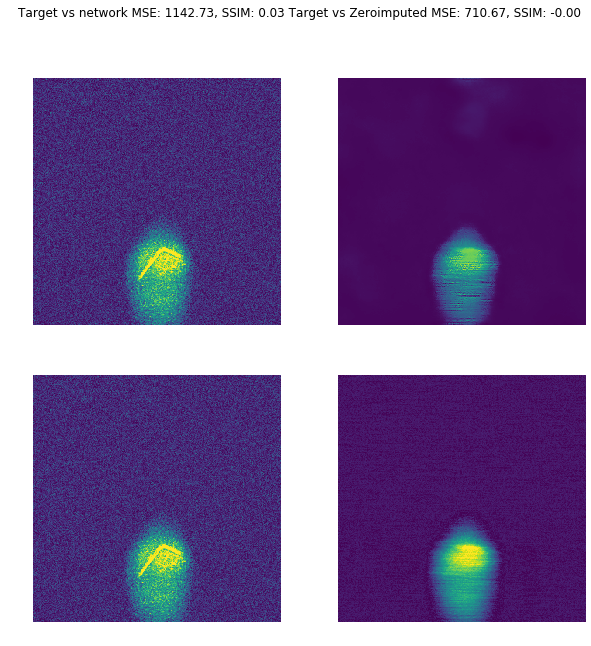

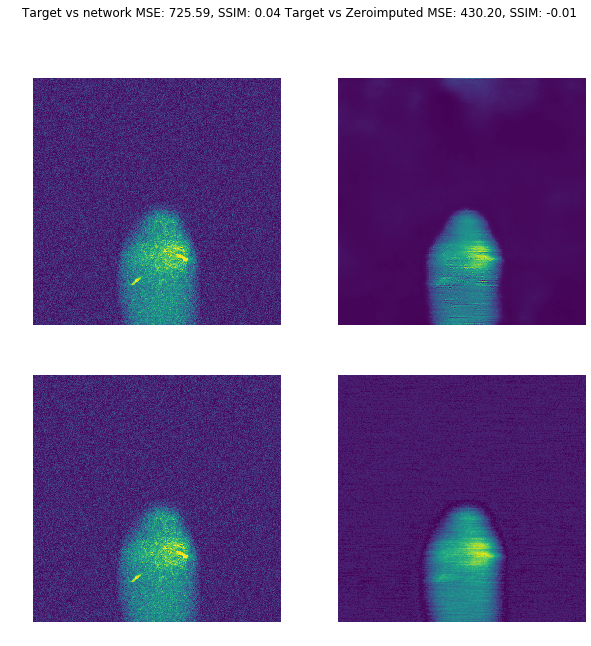

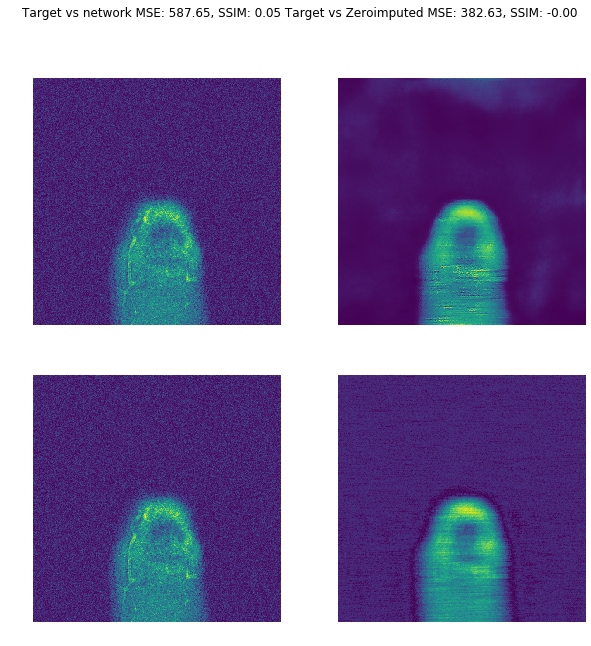

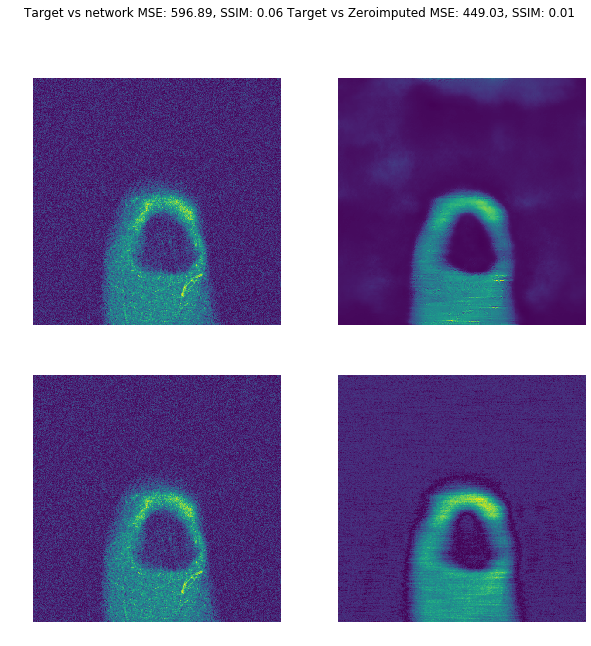

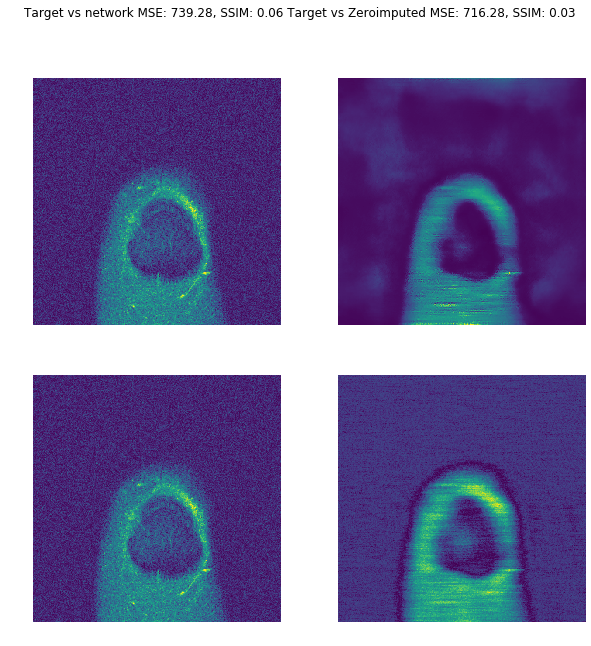

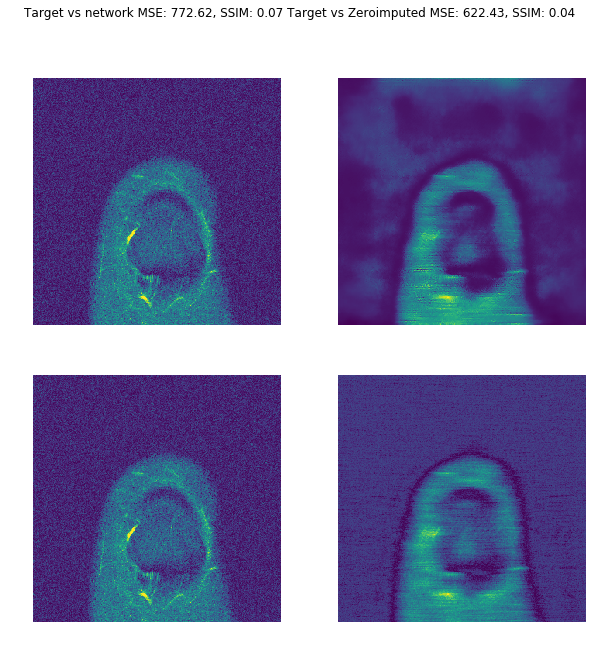

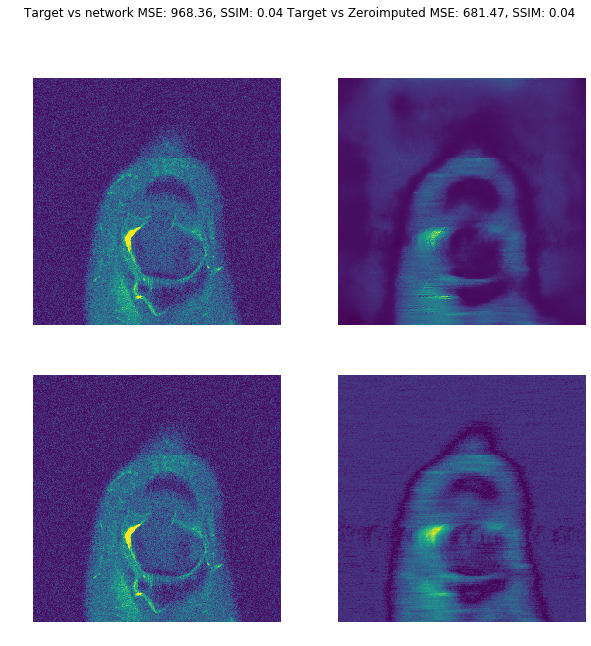

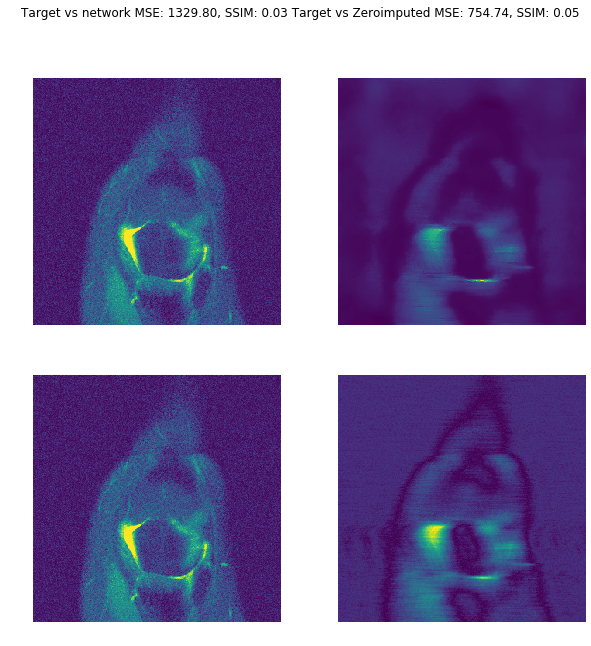

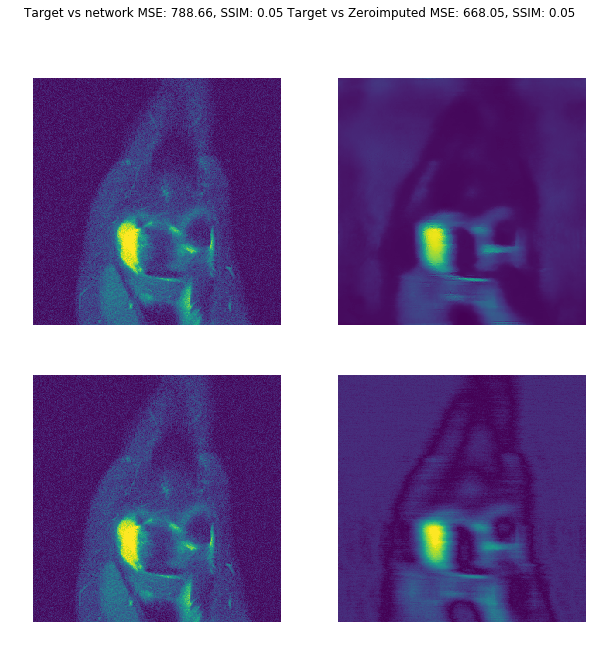

In [6]:
stats = np.load("/home/sumeet_ranka47_gmail_com/git/fastMRI/training_data_stats20.npy")

model = fsnet.wnet(stats[0],stats[1],stats[2],stats[3],\
                                   kshape = (5,5),kshape2=(3,3))

opt = Adam()
model.compile(loss = [fsnet.nrmse,fsnet.nrmse],optimizer=opt, loss_weights=[0.01, 0.99])

model_name = "../Models/wnet_dc20.hdf5"
model.load_weights(model_name)

pred = model.predict(smasked_kspace)[1].astype(np.float64)
fig = plt.figure()
for i in range(10):
    blurred = np.abs(np.fft.ifft2(masked_kspace[i,:,:,0]+1j*masked_kspace[i,:,:,1]))
    compare_images(np.array(target[i]),pred[i,:,:,0],blurred)

<Figure size 432x288 with 0 Axes>

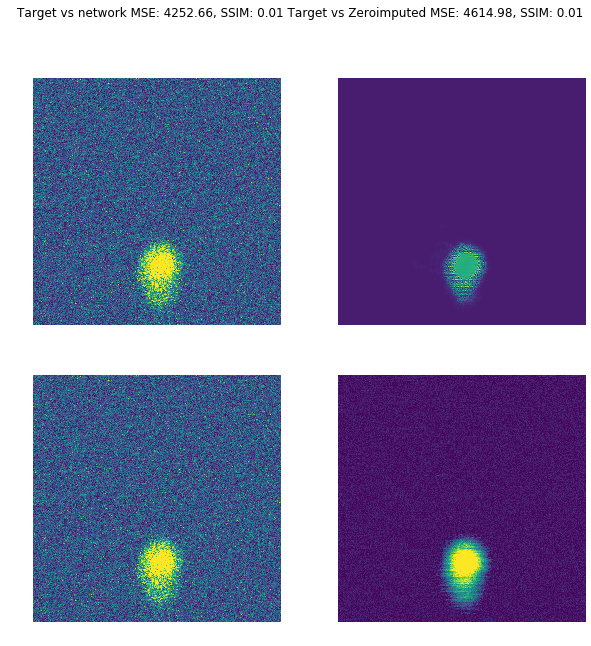

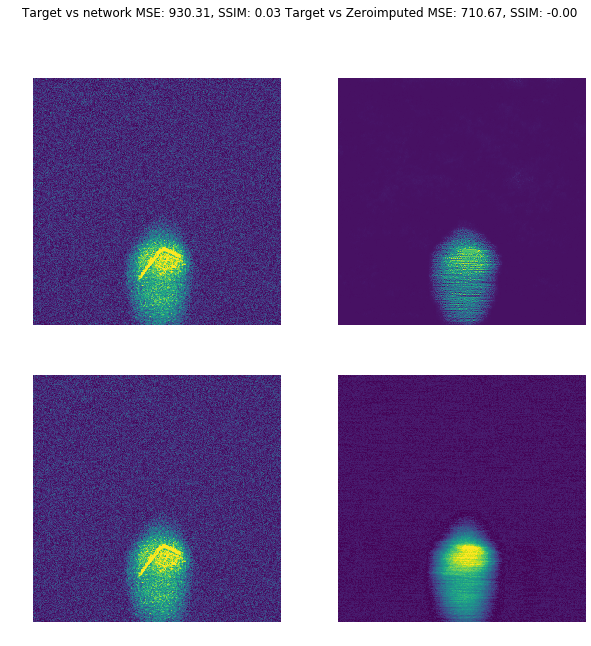

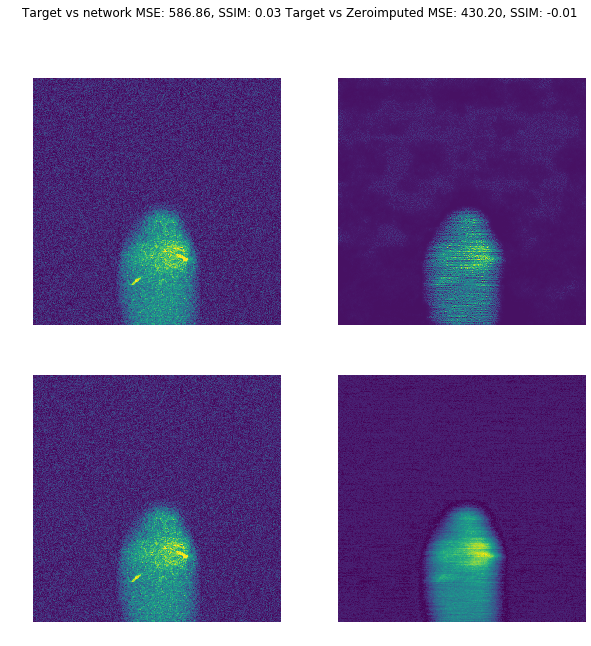

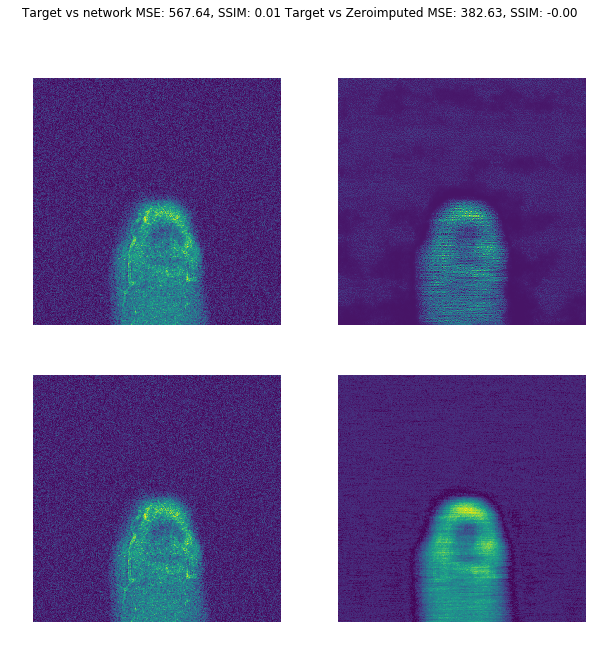

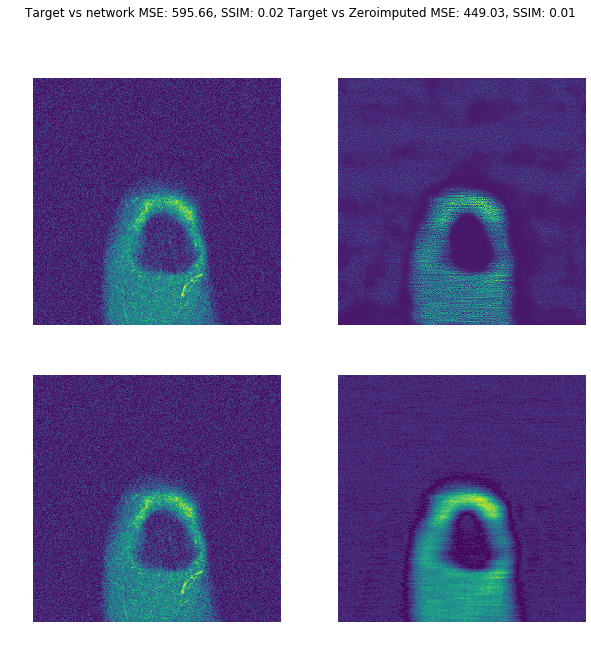

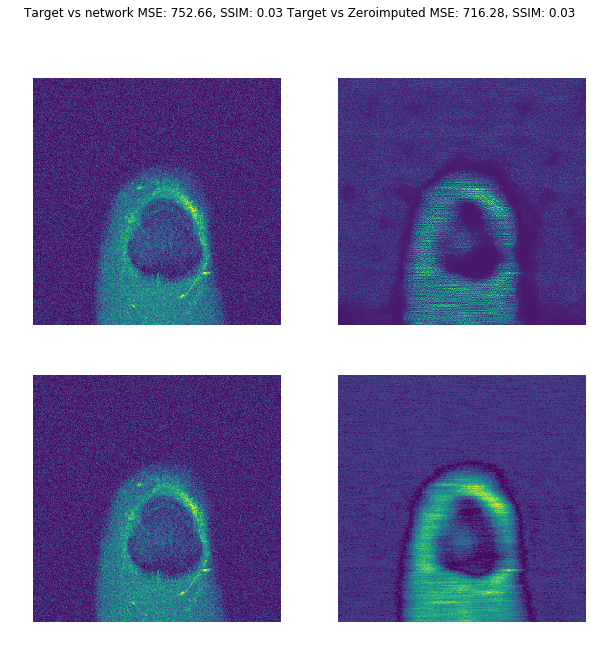

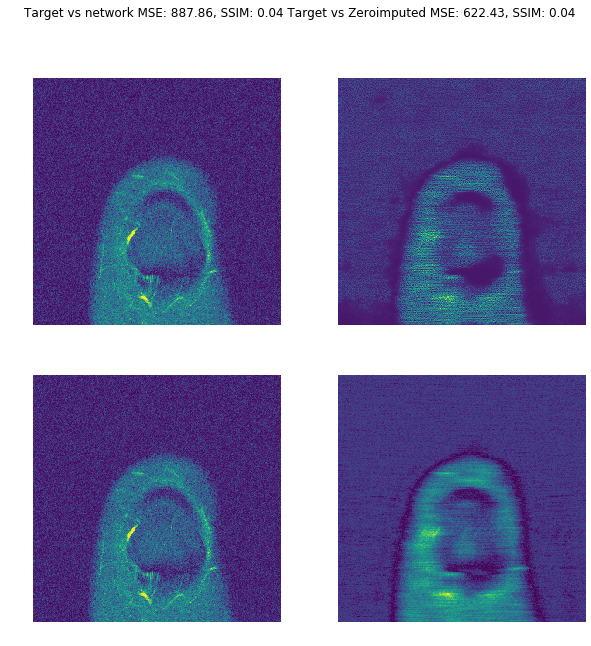

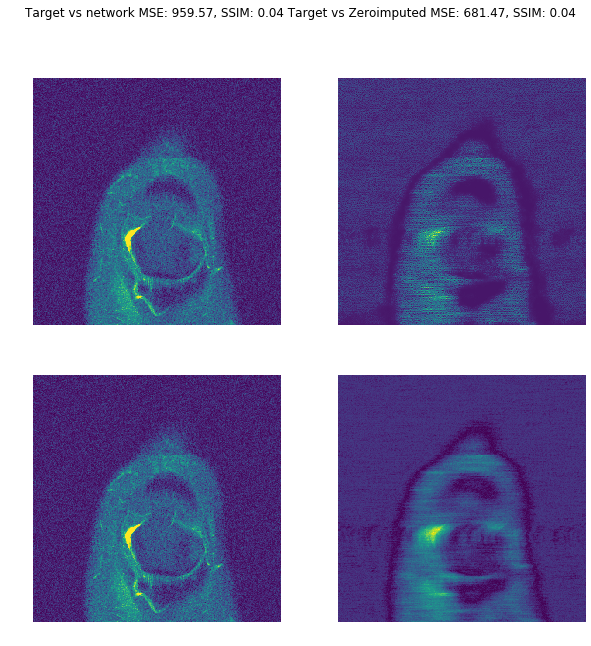

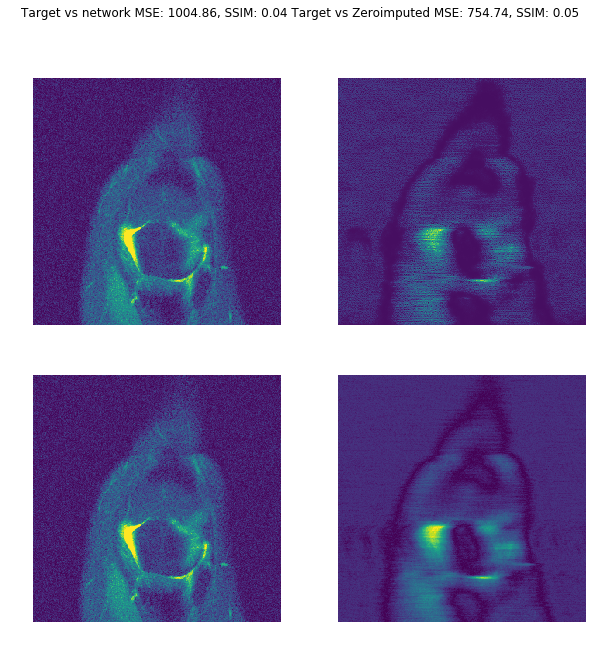

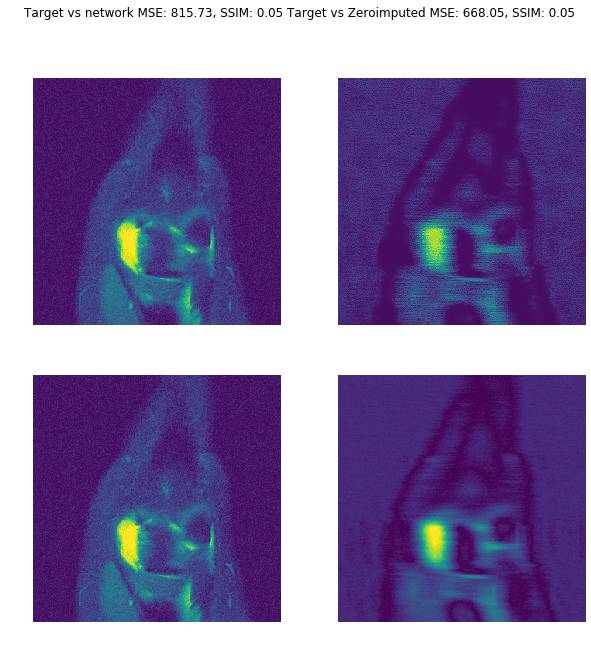

In [7]:
stats = np.load("/home/sumeet_ranka47_gmail_com/git/fastMRI/training_data_stats20.npy")

model = fsnet.wnet(stats[0],stats[1],stats[2],stats[3],\
                                   kshape = (5,5),kshape2=(3,3))

opt = Adam()
model.compile(loss = [fsnet.nrmse,fsnet.nrmse],optimizer=opt, loss_weights=[0.01, 0.99])

model_name = "../Models/wnet_20.hdf5"
model.load_weights(model_name)

pred = model.predict(masked_kspace)[1].astype(np.float64)
fig = plt.figure()
for i in range(10):
    blurred = np.abs(np.fft.ifft2(masked_kspace[i,:,:,0]+1j*masked_kspace[i,:,:,1]))
    compare_images(np.array(target[i]),pred[i,:,:,0],blurred)

In [11]:
def kspaceto2dimage(kspace,cropping = False):
    if cropping:
        image = croppedimage(kspace)
    else:
        image = transforms.ifft2(kspace)
    # Absolute value
    image = transforms.complex_abs(image)
    # Normalize input
    image, mean, std = transforms.normalize_instance(image, eps=1e-11)
    image = image.clamp(-6, 6)

    return image

def plotimage(image):
    plt.imshow(np.array(image))
    plt.show()

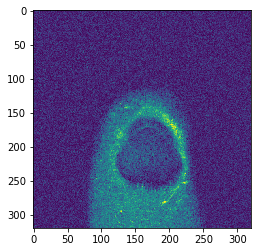

In [13]:
plt.imshow(target[5])

Undersampling: 0.5266796875
Mask type: bool


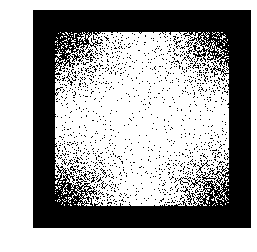

In [219]:
under_rate = '20'
imshape = (256,256)
norm = np.sqrt(imshape[0]*imshape[1])
nchannels = 2 #complex data real + imag

var_sampling_mask = np.load("/home/sumeet_ranka47_gmail_com/Hybrid-CS-Model-MRI/Data/sampling_mask_" + under_rate + "perc.npy")
var_sampling_mask = np.pad(var_sampling_mask, ((32,32),(32,32)), mode='constant', constant_values=False)
print("Undersampling:", 1.0*var_sampling_mask.sum()/var_sampling_mask.size)
print("Mask type:",  var_sampling_mask.dtype)
plt.figure()
plt.imshow(var_sampling_mask,cmap = "gray")
plt.axis("off")
plt.show()

In [221]:
def randX(x):
    p = np.poly1d([1, 2, 3])
    p(x)
    
rng = np.random.RandomState()
rng.uniform(size=num_cols) < prob

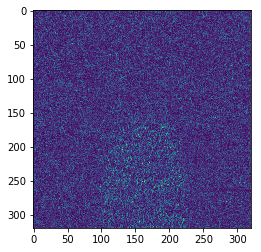

In [220]:
okspace = np.fft.fftshift(original_kspace[:,:,:,0]+1j*original_kspace[:,:,:,1])
kspace = original_kspace.copy()
kspace[0:10,:,:,0] = okspace[0:10].real
kspace[0:10,:,:,1] = okspace[0:10].imag
kspace[:,var_sampling_mask,:] = 0
plt.imshow(np.abs(np.fft.ifft2(np.fft.fftshift(kspace[idx,:,:,0]+1j*kspace[idx,:,:,1]))))

Undersampling: 0.834375
Mask type: float64


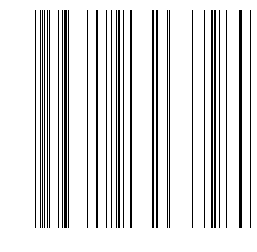

In [205]:
x = np.zeros((320,320))
x[:,] = np.array(mask[0,0,:,0])
print("Undersampling:", 1.0*x.sum()/x.size)
print("Mask type:",  x.dtype)
plt.figure()
plt.imshow(x,cmap = "gray")
plt.axis("off")
plt.show()

In [225]:
image = transforms.ifft2(transforms.to_tensor(original_kspace).float())
original_kspace = transforms.fft2(image)

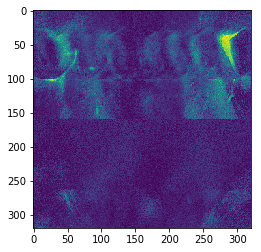

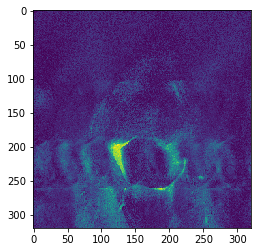

In [230]:
idx=8
import common.subsample as subsample
dev_mask = subsample.MaskFunc([0.08,0.04], [1.265,1.665])
masked_kspace, mask = transforms.apply_mask(original_kspace, dev_mask, 10)
plotimage(kspaceto2dimage(masked_kspace)[idx])
masked_kspace = np.array(masked_kspace)
plt.imshow(np.abs(np.fft.ifft2(np.fft.fftshift(masked_kspace[idx,:,:,0]+1j*masked_kspace[idx,:,:,1]))))

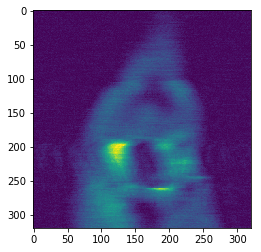

In [201]:
plt.imshow(input[idx])